# Project 1| Unsupervised Learning

The purpose of the case study is to classify a given silhouette as one of four different types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles. Four &quot;Corgie&quot; model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars. The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

In [1]:
%matplotlib inline
## Import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_color_codes()



In [2]:
# load the dataset

sh_df = pd.read_csv('vehicle.csv')
sh_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [3]:

# Shape of the dataset
sh_df.shape

(846, 19)

### 1. Data pre-processing - Understand the data and treat missing values (Use box plot), outliers (5 points)

1a - Understand the data

1b - Find missing values

1c - Treat missing values

1d - Find outliers

1e - Treat outliers

#### 1a - Understand the data

In [4]:
sh_df.info()
# Distribution of data types -
# dtypes: float64(14), int64(4), object(1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

In [5]:
sh_df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
compactness,846,NaN,NaN,NaN,93.6785,8.23447,73,87,93,100,119
circularity,841,NaN,NaN,NaN,44.8288,6.15217,33,40,44,49,59
distance_circularity,842,NaN,NaN,NaN,82.1105,15.7783,40,70,80,98,112
radius_ratio,840,NaN,NaN,NaN,168.888,33.5202,104,141,167,195,333
pr.axis_aspect_ratio,844,NaN,NaN,NaN,61.6789,7.89146,47,57,61,65,138
max.length_aspect_ratio,846,NaN,NaN,NaN,8.56738,4.60122,2,7,8,10,55
scatter_ratio,845,NaN,NaN,NaN,168.902,33.2148,112,147,157,198,265
elongatedness,845,NaN,NaN,NaN,40.9337,7.81619,26,33,43,46,61
pr.axis_rectangularity,843,NaN,NaN,NaN,20.5824,2.59293,17,19,20,23,29
max.length_rectangularity,846,NaN,NaN,NaN,147.999,14.5157,118,137,146,159,188


In [7]:
# Finding Unique values
for i in sh_df.columns:
    print(i ,':', sh_df[i].unique() )

compactness : [ 95  91 104  93  85 107  97  90  86  88  89  94  96  99 101  84  87  83
 102  80 100  82 106  81 119  78  92  98 103  77  73  79 110 108 109 111
 105 112 116 113 117 115  76 114]
circularity : [48. 41. 50. 44. nan 43. 34. 36. 46. 42. 49. 55. 54. 56. 47. 37. 39. 53.
 45. 38. 35. 40. 59. 52. 51. 58. 57. 33.]
distance_circularity : [ 83.  84. 106.  82.  70.  73.  66.  62.  98.  74.  85.  79. 103.  51.
  77. 100.  75.  53.  64. 105.  80.  54.  63. 107.  nan  72.  86.  68.
 104.  87.  76.  81.  71. 101.  96.  78. 108.  91.  89.  94.  92.  60.
  57.  65.  50.  88. 109.  95.  90.  58.  69.  47.  40.  59. 110.  93.
 102. 112.  61.  42.  49.  44.  52.  55.]
radius_ratio : [178. 141. 209. 159. 205. 172. 173. 157. 140.  nan 143. 136. 171. 144.
 203. 201. 109. 197. 186. 215. 153. 121. 148. 219. 154. 119. 193. 129.
 160. 151. 222. 177. 118. 306. 176. 169. 214. 105. 137. 183. 220. 145.
 133. 122. 147. 115. 174. 228. 175. 185. 195. 221. 212. 135. 120. 156.
 125. 164. 161. 227. 191. 111

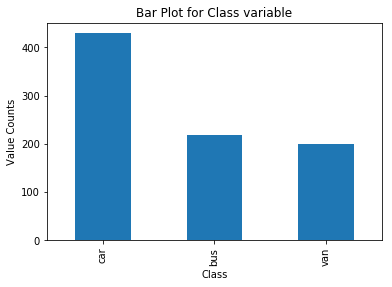

In [8]:
pd.value_counts(sh_df['class']).plot(kind = 'bar')
plt.title('Bar Plot for Class variable')
plt.xlabel('Class')
plt.ylabel('Value Counts')
plt.show()

In [86]:
sh_df['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

 #### 1b -  Find missing values

In [9]:
sh_df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

Since above technique did not show missing values we will loop through individual column

In [11]:
sh_df.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

Since above technique did not show missing values we will loop through individual column

#### 1c - Treat missing values

In [13]:
# Both using isnull and isnan produced same missing values count.
# Fill the missing values with mean (as per obersations from the describe)

sh_df = sh_df.fillna(sh_df.mean())

In [14]:
sh_df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [15]:

## Verify after imputing

for col in sh_df.columns:
    print('# Missing values for col \'{}\': {}'.format(col, sh_df[col].isna().sum()))

# Missing values for col 'compactness': 0
# Missing values for col 'circularity': 0
# Missing values for col 'distance_circularity': 0
# Missing values for col 'radius_ratio': 0
# Missing values for col 'pr.axis_aspect_ratio': 0
# Missing values for col 'max.length_aspect_ratio': 0
# Missing values for col 'scatter_ratio': 0
# Missing values for col 'elongatedness': 0
# Missing values for col 'pr.axis_rectangularity': 0
# Missing values for col 'max.length_rectangularity': 0
# Missing values for col 'scaled_variance': 0
# Missing values for col 'scaled_variance.1': 0
# Missing values for col 'scaled_radius_of_gyration': 0
# Missing values for col 'scaled_radius_of_gyration.1': 0
# Missing values for col 'skewness_about': 0
# Missing values for col 'skewness_about.1': 0
# Missing values for col 'skewness_about.2': 0
# Missing values for col 'hollows_ratio': 0
# Missing values for col 'class': 0


### Univarivate Analysis, BI Varaite Analysis

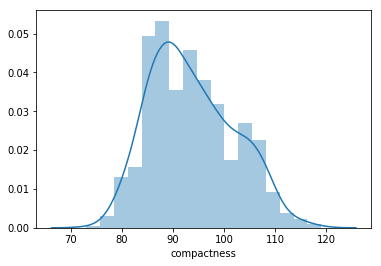

In [16]:
sns.distplot(sh_df['compactness'])

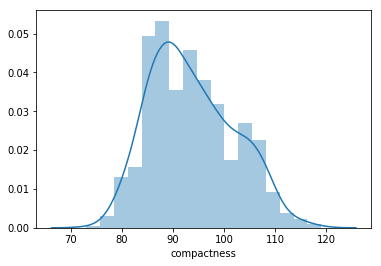

In [17]:
sns.distplot(sh_df['compactness'])


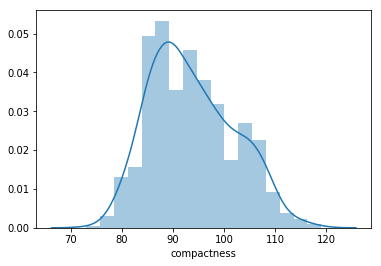

In [18]:
sns.distplot(sh_df['compactness'])

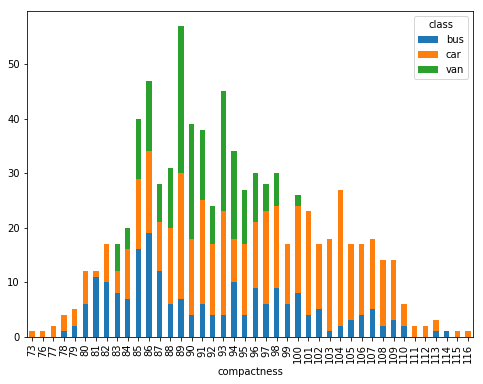

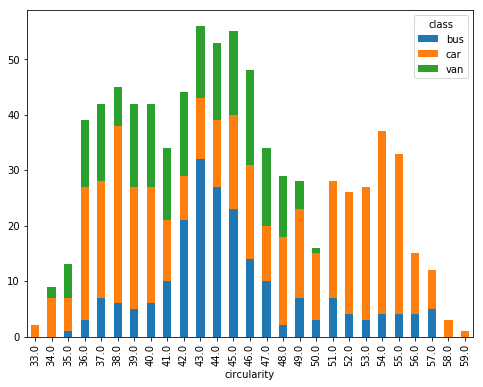

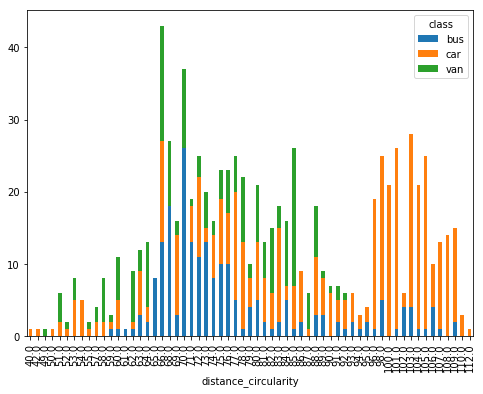

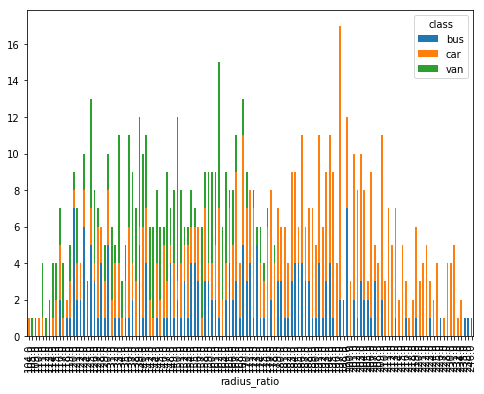

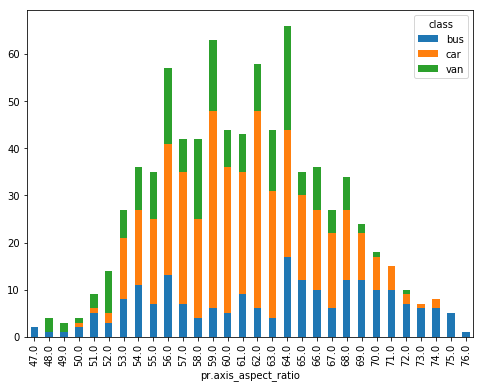

...

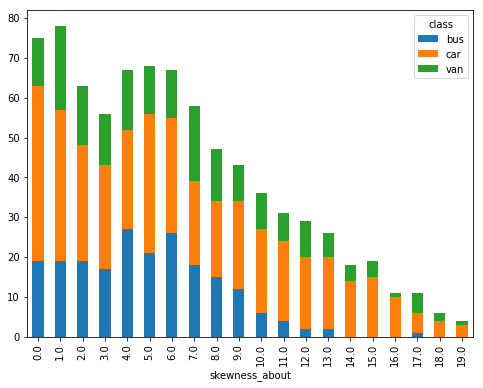

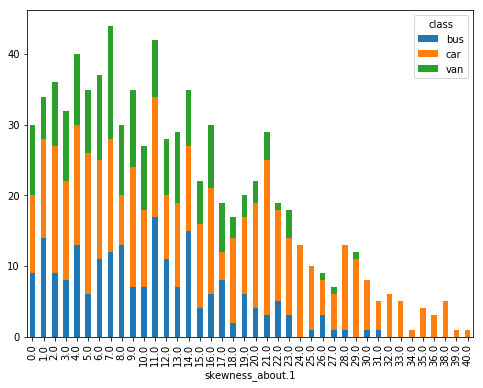

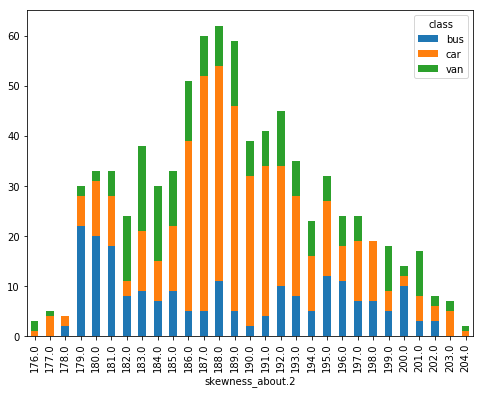

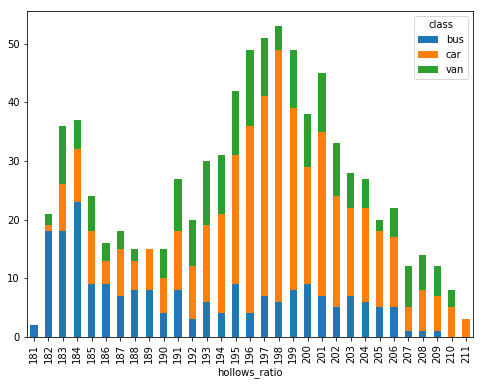

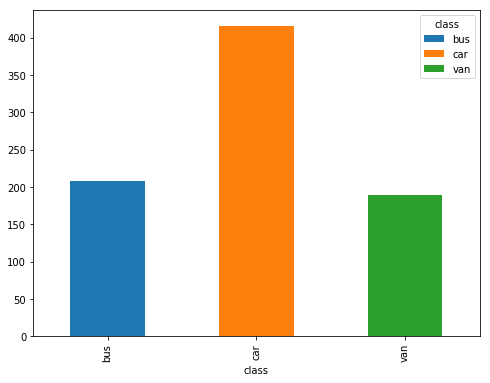

In [81]:

for i in sh_df.columns:
    sh_df.groupby(i)['class'].value_counts().unstack().plot(kind = 'bar', stacked = True, figsize = (8,6))

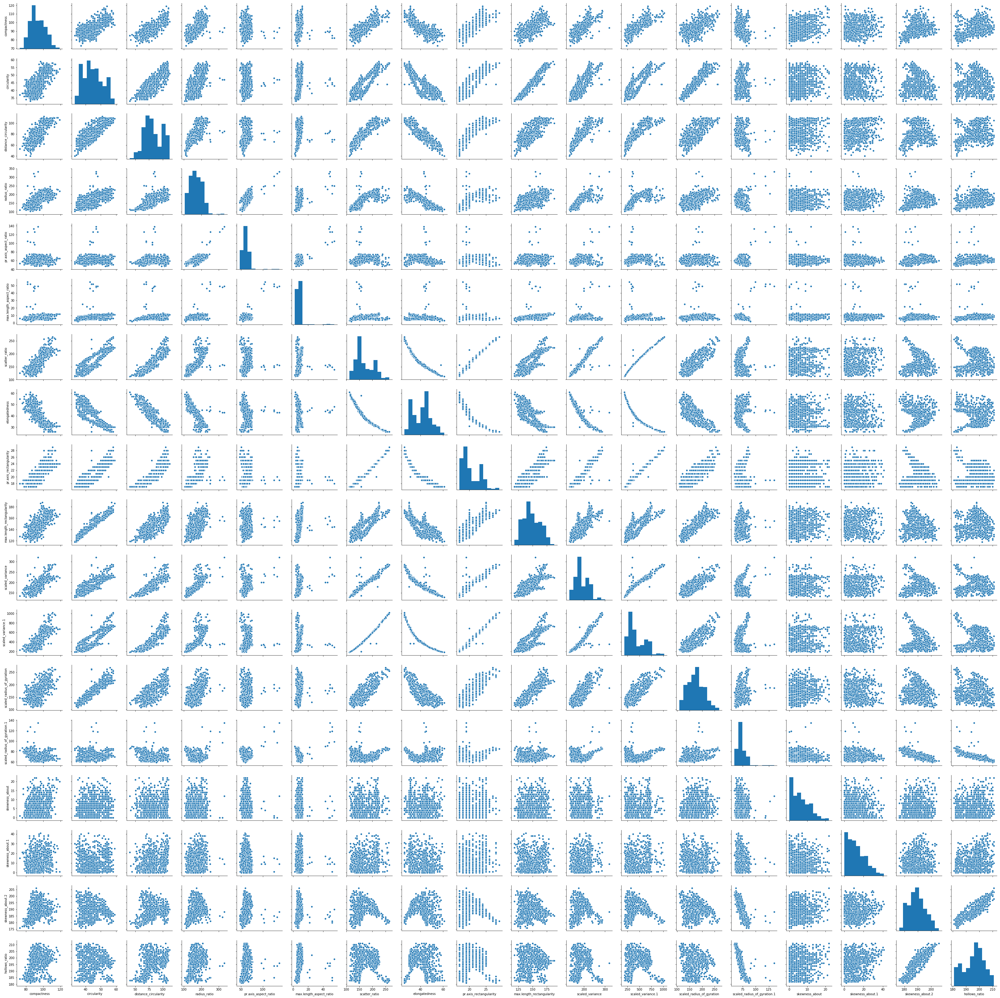

In [72]:
sns.pairplot(sh_df)

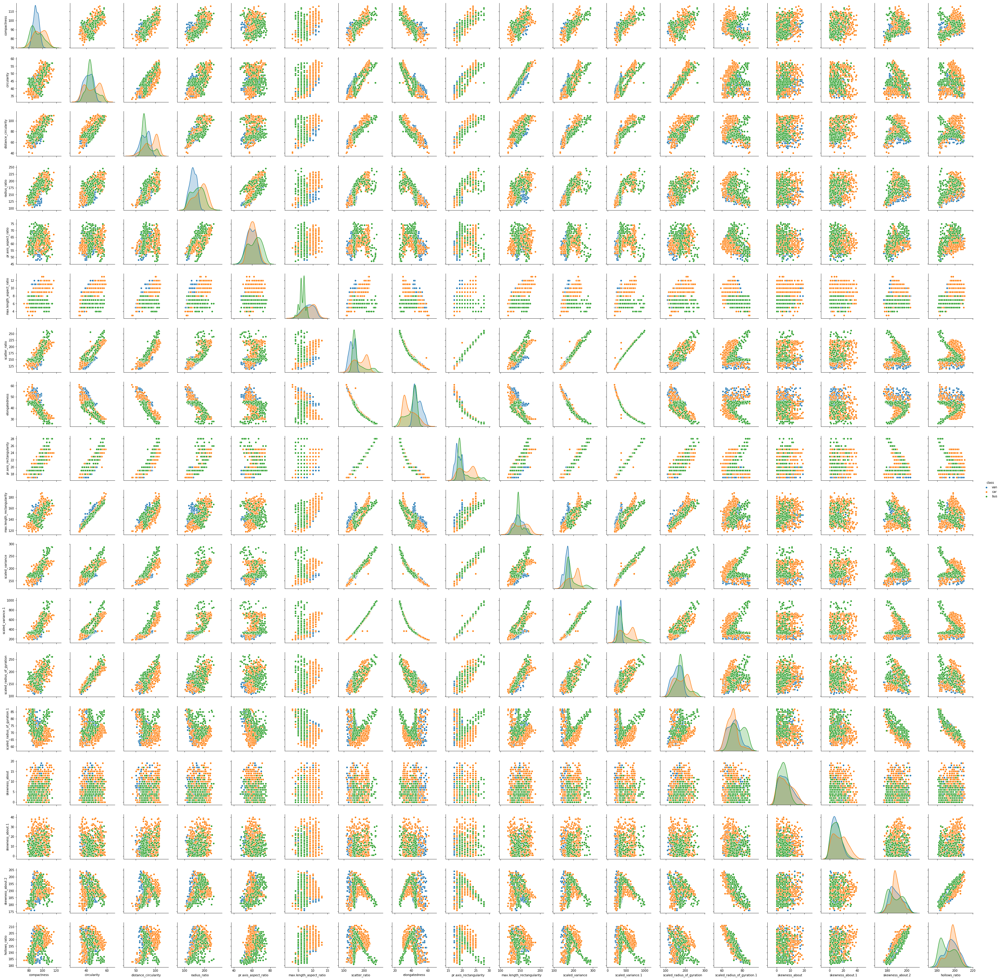

In [51]:
sns.pairplot(data=sh_df, diag_kind='kde', hue='class')

C:\Users\ABHIJEET\Anaconda4\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


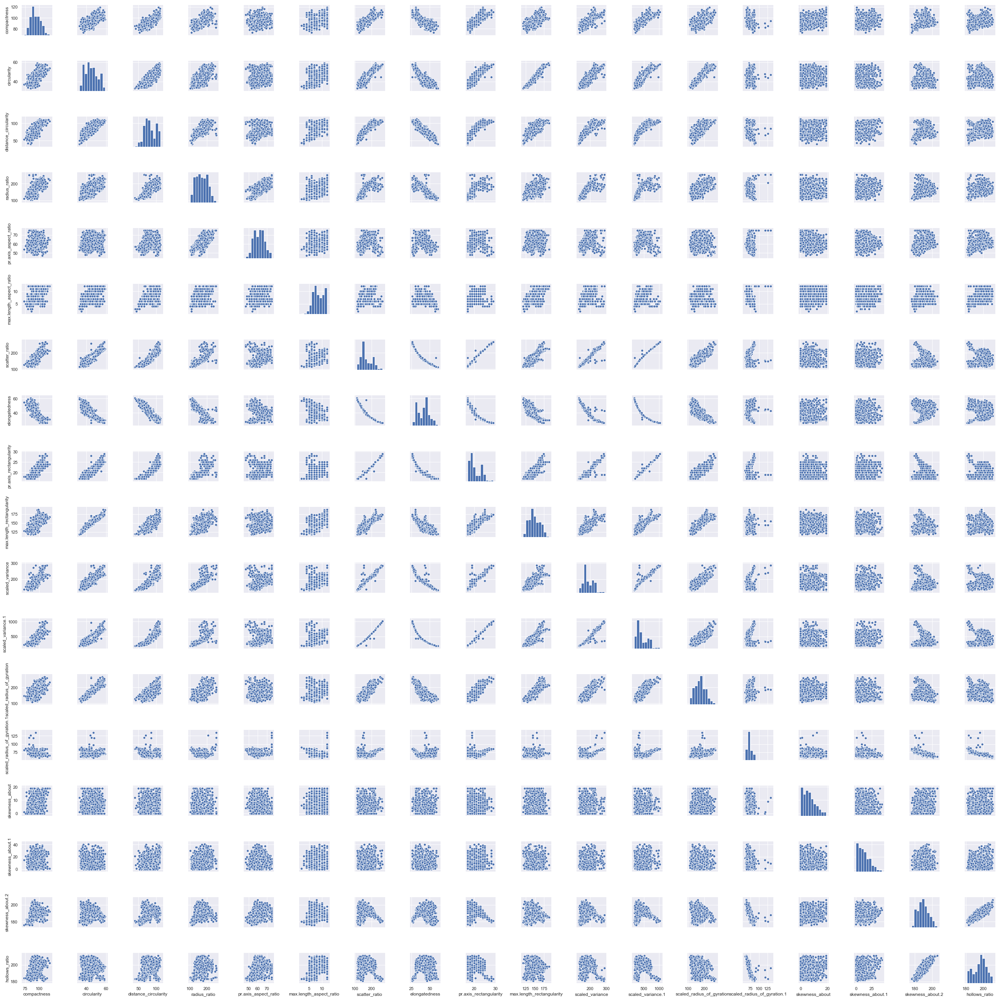

In [87]:
sns.set()
sns.pairplot(sh_df, size = 2.0)
plt.show()

In [19]:
sh_df.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.685421,0.789909,0.689840,0.091704,0.148249,0.812235,-0.788643,0.813636,0.676143,0.762770,0.815901,0.585156,-0.250071,0.235687,0.157387,0.298526,0.365552
circularity,0.685421,1.000000,0.793016,0.620967,0.153362,0.251208,0.848207,-0.821901,0.844972,0.961943,0.796822,0.838525,0.926888,0.052642,0.144394,-0.011851,-0.105645,0.045318
distance_circularity,0.789909,0.793016,1.000000,0.767079,0.158397,0.264550,0.904400,-0.911435,0.893128,0.774669,0.861980,0.887328,0.705953,-0.225852,0.113813,0.265553,0.145563,0.332095
radius_ratio,0.689840,0.620967,0.767079,1.000000,0.663559,0.450036,0.734228,-0.789795,0.708285,0.569205,0.794041,0.720150,0.536536,-0.180819,0.048720,0.173832,0.382129,0.471262
pr.axis_aspect_ratio,0.091704,0.153362,0.158397,0.663559,1.000000,0.648704,0.103715,-0.183264,0.079395,0.127128,0.273414,0.089620,0.122111,0.152776,-0.058481,-0.032134,0.239849,0.267724
max.length_aspect_ratio,0.148249,0.251208,0.264550,0.450036,0.648704,1.000000,0.165967,-0.180041,0.161592,0.305943,0.318955,0.143713,0.189704,0.295574,0.015439,0.043489,-0.026180,0.143919
scatter_ratio,0.812235,0.848207,0.904400,0.734228,0.103715,0.165967,1.000000,-0.970723,0.989370,0.808356,0.948296,0.993784,0.799266,-0.027985,0.074308,0.213127,0.005167,0.118448
elongatedness,-0.788643,-0.821901,-0.911435,-0.789795,-0.183264,-0.180041,-0.970723,1.000000,-0.949077,-0.775519,-0.936715,-0.955074,-0.766029,0.103481,-0.051997,-0.185691,-0.114727,-0.216719
pr.axis_rectangularity,0.813636,0.844972,0.893128,0.708285,0.079395,0.161592,0.989370,-0.949077,1.000000,0.811447,0.934568,0.989490,0.797068,-0.015676,0.082974,0.214734,-0.018990,0.099191
max.length_rectangularity,0.676143,0.961943,0.774669,0.569205,0.127128,0.305943,0.808356,-0.775519,0.811447,1.000000,0.745209,0.796018,0.866425,0.041220,0.135745,0.001658,-0.104254,0.076770


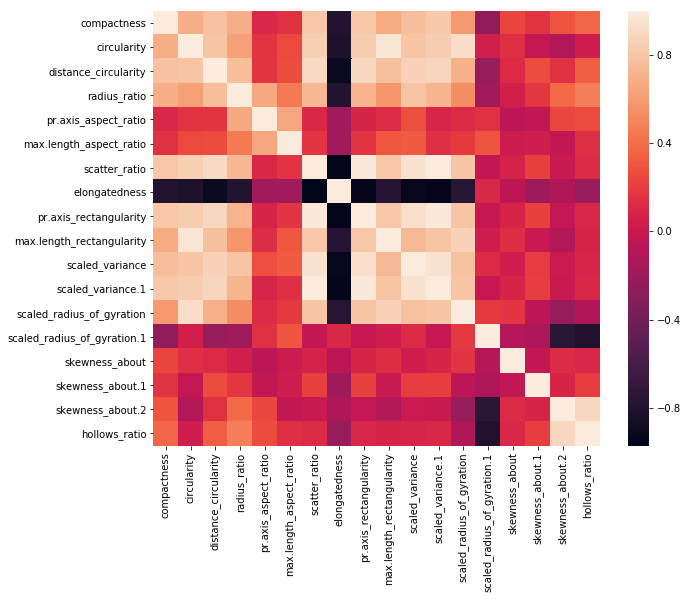

In [20]:
plt.subplots(figsize=(10,8))
sns.heatmap(sh_df.corr())

Following variables are highly correlated (positively) : scaled_variance, scaled_variance.1, scatter_ratio, pr.axis_rectangulaity
Following variable are highly negatively correlated: elongatedness, compactness, circularity, distance_circularity, radius_ratio, scatter_ratio, pr.axis_rectangularity, max.length_rectangularity, scaled_variance, scaled_variance.1, scaled_radius_of_gyration
The variables, skewness_about.2, hollows_ratioo and scaled_radius_of_gyration.1 are also highly negatively correlated

From above it is clear the following features have outlier - radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance, scaled_variance.1, scaled_radius_of_gyration.1, skewness_about, skewness_about.1

#### 1d - Find outliers

In [21]:
from itertools import chain

numeric_cols = sh_df.select_dtypes(include=['float64', 'int64']).columns

outlier_rec = []
# For each predictors find outliers using mathematical function.
def find_outlier(df_in, col_name, verbose=False):
    q25 = df_in[col_name].quantile(0.25)
    q75 = df_in[col_name].quantile(0.75)
    iqr = q75-q25 #Interquartile range
    lower, upper  = q25-1.5*iqr, q75+1.5*iqr
    outliers_df = df_in[(df_in[col_name] < lower) | (df_in[col_name] > upper)]
    outliers_removed_df = df_in[(df_in[col_name] >= lower) & (df_in[col_name] <= upper)]
    
    if(verbose):
        print('# Number of outliers / non-outliers for column \'{}\': {} /{}'.format(
            col_name, outliers_df.shape[0], outliers_removed_df.shape[0]))
    return outliers_df.index.tolist();

for feature in numeric_cols:
    outlier_rec.append(find_outlier(sh_df, feature, True))
    
outlier_rec = list(chain.from_iterable(outlier_rec))
outlier_rec = list(set(outlier_rec)) 
outlier_rec.sort()
print('# Total outliers in the dataset: {}'.format(len(outlier_rec)))
print(outlier_rec)

# Number of outliers / non-outliers for column 'compactness': 0 /846
# Number of outliers / non-outliers for column 'circularity': 0 /846
# Number of outliers / non-outliers for column 'distance_circularity': 0 /846
# Number of outliers / non-outliers for column 'radius_ratio': 3 /843
# Number of outliers / non-outliers for column 'pr.axis_aspect_ratio': 8 /838
# Number of outliers / non-outliers for column 'max.length_aspect_ratio': 13 /833
# Number of outliers / non-outliers for column 'scatter_ratio': 0 /846
# Number of outliers / non-outliers for column 'elongatedness': 0 /846
# Number of outliers / non-outliers for column 'pr.axis_rectangularity': 0 /846
# Number of outliers / non-outliers for column 'max.length_rectangularity': 0 /846
# Number of outliers / non-outliers for column 'scaled_variance': 1 /845
# Number of outliers / non-outliers for column 'scaled_variance.1': 2 /844
# Number of outliers / non-outliers for column 'scaled_radius_of_gyration': 0 /846
# Number of outlie

[Text(0, 0, 'compactness'),
 Text(0, 0, 'circularity'),
 Text(0, 0, 'distance_circularity'),
 Text(0, 0, 'radius_ratio'),
 Text(0, 0, 'pr.axis_aspect_ratio'),
 Text(0, 0, 'max.length_aspect_ratio'),
 Text(0, 0, 'scatter_ratio'),
 Text(0, 0, 'elongatedness'),
 Text(0, 0, 'pr.axis_rectangularity'),
 Text(0, 0, 'max.length_rectangularity'),
 Text(0, 0, 'scaled_variance'),
 Text(0, 0, 'scaled_variance.1'),
 Text(0, 0, 'scaled_radius_of_gyration'),
 Text(0, 0, 'scaled_radius_of_gyration.1'),
 Text(0, 0, 'skewness_about'),
 Text(0, 0, 'skewness_about.1'),
 Text(0, 0, 'skewness_about.2'),
 Text(0, 0, 'hollows_ratio')]

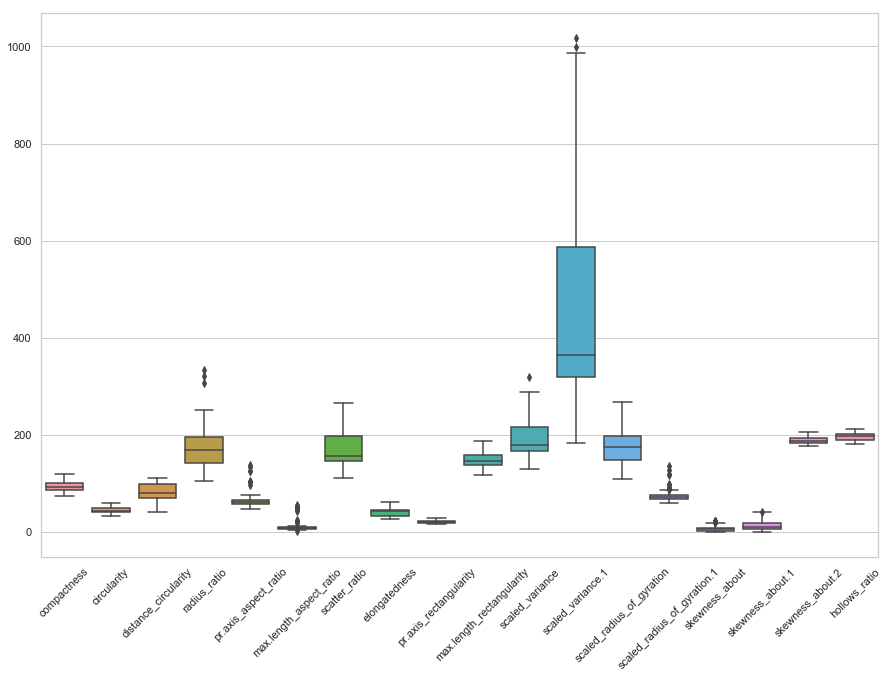

In [22]:
plt.figure(figsize=(15,10))
labels = sh_df.columns
sns.set(style='whitegrid')
sbplot = sns.boxplot(data=sh_df)
sbplot.set_xticklabels(labels=labels, rotation=45)

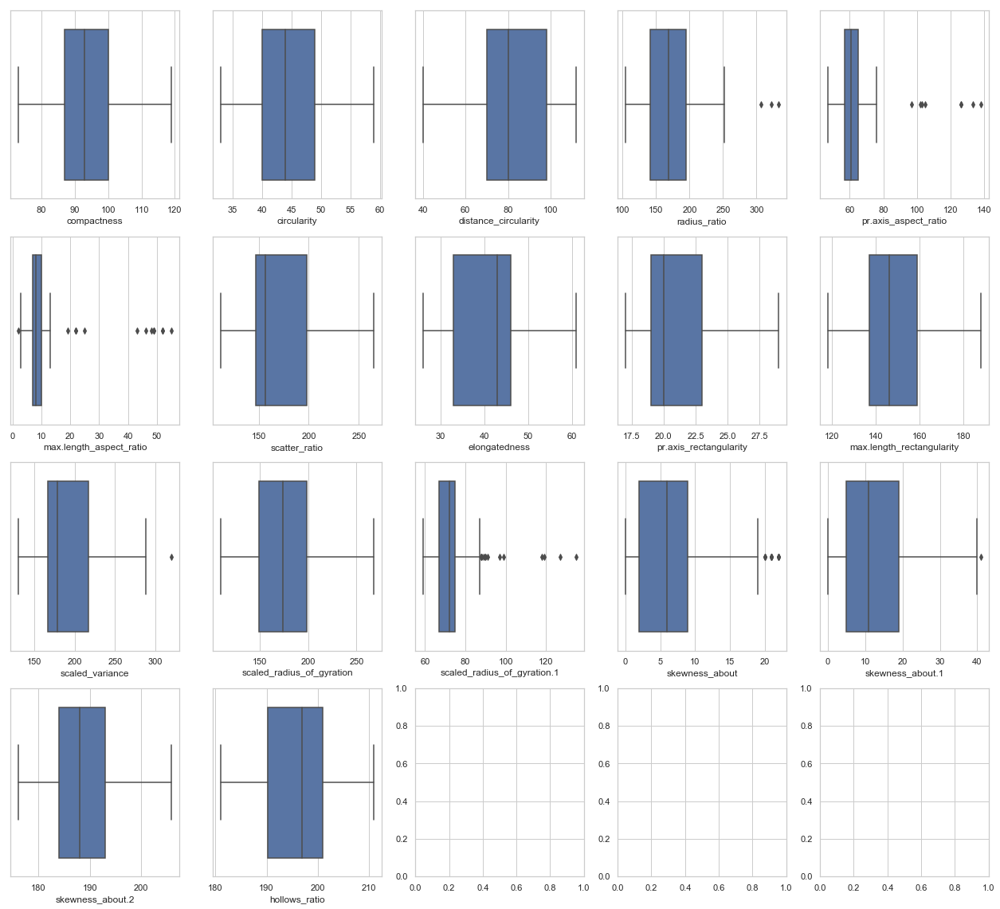

In [23]:
fig, ax = plt.subplots(4,5, figsize=(22,20))

sns.boxplot(sh_df['compactness'], ax=ax[0,0])
sns.boxplot(sh_df['circularity'], ax=ax[0,1])
sns.boxplot(sh_df['distance_circularity'], ax=ax[0,2])
sns.boxplot(sh_df['radius_ratio'], ax=ax[0,3])
sns.boxplot(sh_df['pr.axis_aspect_ratio'], ax=ax[0,4])
sns.boxplot(sh_df['max.length_aspect_ratio'], ax=ax[1,0])
sns.boxplot(sh_df['scatter_ratio'], ax=ax[1,1])
sns.boxplot(sh_df['elongatedness'], ax=ax[1,2])
sns.boxplot(sh_df['pr.axis_rectangularity'], ax=ax[1,3])
sns.boxplot(sh_df['max.length_rectangularity'], ax=ax[1,4])
sns.boxplot(sh_df['scaled_variance'], ax=ax[2,0])
sns.boxplot(sh_df['scaled_radius_of_gyration'], ax=ax[2,1])
sns.boxplot(sh_df['scaled_radius_of_gyration.1'], ax=ax[2,2])
sns.boxplot(sh_df['skewness_about'], ax=ax[2,3])
sns.boxplot(sh_df['skewness_about.1'], ax=ax[2,4])
sns.boxplot(sh_df['skewness_about.2'], ax=ax[3,0])
sns.boxplot(sh_df['hollows_ratio'], ax=ax[3,1])

From above it is clear the following features have outlier - radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance, scaled_variance.1, scaled_radius_of_gyration.1, skewness_about, skewness_about.

#### 1e - Treat outliers

In [95]:
pd.crosstab(sh_df['radius_ratio'], sh_df['class'])

class,bus,car,van
radius_ratio,,,
104.0,0,1,0
105.0,0,0,1
109.0,0,0,1
110.0,0,1,2
111.0,0,1,3
112.0,0,0,1
113.0,2,0,2
114.0,0,1,3
115.0,0,2,2


In [96]:
sh_df['radius_ratio'] = np.where(sh_df['radius_ratio']>=300, 252, sh_df['radius_ratio'])

In [97]:
pd.crosstab(sh_df['radius_ratio'], sh_df['class'])

class,bus,car,van
radius_ratio,,,
104.0,0,1,0
105.0,0,0,1
109.0,0,0,1
110.0,0,1,2
111.0,0,1,3
112.0,0,0,1
113.0,2,0,2
114.0,0,1,3
115.0,0,2,2


In [98]:
pd.crosstab(sh_df['pr.axis_aspect_ratio'], sh_df['class'])

class,bus,car,van
pr.axis_aspect_ratio,,,
47.00000,2,0,0
48.00000,1,0,3
49.00000,1,0,2
50.00000,3,1,1
51.00000,7,1,3
52.00000,3,2,9
53.00000,8,13,6
54.00000,12,16,10
55.00000,7,19,11


In [99]:
sh_df['pr.axis_aspect_ratio'] = np.where(sh_df['pr.axis_aspect_ratio']>=76, 75, sh_df['pr.axis_aspect_ratio'])

In [100]:
pd.crosstab(sh_df['pr.axis_aspect_ratio'], sh_df['class'])

class,bus,car,van
pr.axis_aspect_ratio,,,
47.00000,2,0,0
48.00000,1,0,3
49.00000,1,0,2
50.00000,3,1,1
51.00000,7,1,3
52.00000,3,2,9
53.00000,8,13,6
54.00000,12,16,10
55.00000,7,19,11


In [101]:
pd.crosstab(sh_df['max.length_aspect_ratio'], sh_df['class'])

class,bus,car,van
max.length_aspect_ratio,,,
2,0,0,1
3,0,2,2
4,7,9,2
5,26,15,10
6,78,35,19
7,80,62,26
8,22,58,33
9,0,60,34
10,0,80,32


In [102]:
sh_df['max.length_aspect_ratio'] = np.where(sh_df['max.length_aspect_ratio']>=13, 12, sh_df['max.length_aspect_ratio'])

In [103]:
pd.crosstab(sh_df['max.length_aspect_ratio'], sh_df['class'])

class,bus,car,van
max.length_aspect_ratio,,,
2,0,0,1
3,0,2,2
4,7,9,2
5,26,15,10
6,78,35,19
7,80,62,26
8,22,58,33
9,0,60,34
10,0,80,32


In [104]:
pd.crosstab(sh_df['scaled_variance'], sh_df['class'])

class,bus,car,van
scaled_variance,,,
130.0,0,1,0
131.0,0,1,0
132.0,0,1,0
134.0,0,0,1
135.0,0,3,3
136.0,0,1,1
137.0,0,3,3
138.0,0,0,3
139.0,0,1,3


In [105]:
sh_df['scaled_variance'] = np.where(sh_df['scaled_variance']>=300, 288, sh_df['scaled_variance'])

In [106]:
pd.crosstab(sh_df['scaled_variance'], sh_df['class'])

class,bus,car,van
scaled_variance,,,
130.0,0,1,0
131.0,0,1,0
132.0,0,1,0
134.0,0,0,1
135.0,0,3,3
136.0,0,1,1
137.0,0,3,3
138.0,0,0,3
139.0,0,1,3


In [107]:
pd.crosstab(sh_df['skewness_about'], sh_df['class'])

class,bus,car,van
skewness_about,,,
0.000000,19,44,14
1.000000,22,38,21
2.000000,19,29,15
3.000000,17,26,13
4.000000,28,25,17
5.000000,22,35,14
6.000000,25,27,13
6.364286,4,2,0
7.000000,18,22,20


In [108]:
sh_df['skewness_about'] = np.where(sh_df['skewness_about']>=20, 19, sh_df['skewness_about'])

In [109]:
pd.crosstab(sh_df['skewness_about'], sh_df['class'])

class,bus,car,van
skewness_about,,,
0.000000,19,44,14
1.000000,22,38,21
2.000000,19,29,15
3.000000,17,26,13
4.000000,28,25,17
5.000000,22,35,14
6.000000,25,27,13
6.364286,4,2,0
7.000000,18,22,20


In [110]:
pd.crosstab(sh_df['scaled_radius_of_gyration'], sh_df['class'])

class,bus,car,van
scaled_radius_of_gyration,,,
109.0,0,0,1
112.0,0,0,3
113.0,0,0,1
114.0,0,1,0
115.0,0,1,1
116.0,0,0,2
117.0,1,2,0
118.0,0,1,1
119.0,1,0,3


In [115]:
sh_df['scaled_radius_of_gyration'] = np.where(sh_df['scaled_radius_of_gyration']>=200, 210, sh_df['scaled_radius_of_gyration'])

In [117]:
pd.crosstab(sh_df['scaled_radius_of_gyration'], sh_df['class'])

class,bus,car,van
scaled_radius_of_gyration,,,
109.000000,0,0,1
112.000000,0,0,3
113.000000,0,0,1
114.000000,0,1,0
115.000000,0,1,1
116.000000,0,0,2
117.000000,1,2,0
118.000000,0,1,1
119.000000,1,0,3


[Text(0, 0, 'compactness'),
 Text(0, 0, 'circularity'),
 Text(0, 0, 'distance_circularity'),
 Text(0, 0, 'radius_ratio'),
 Text(0, 0, 'pr.axis_aspect_ratio'),
 Text(0, 0, 'max.length_aspect_ratio'),
 Text(0, 0, 'scatter_ratio'),
 Text(0, 0, 'elongatedness'),
 Text(0, 0, 'pr.axis_rectangularity'),
 Text(0, 0, 'max.length_rectangularity'),
 Text(0, 0, 'scaled_variance'),
 Text(0, 0, 'scaled_variance.1'),
 Text(0, 0, 'scaled_radius_of_gyration'),
 Text(0, 0, 'scaled_radius_of_gyration.1'),
 Text(0, 0, 'skewness_about'),
 Text(0, 0, 'skewness_about.1'),
 Text(0, 0, 'skewness_about.2'),
 Text(0, 0, 'hollows_ratio')]

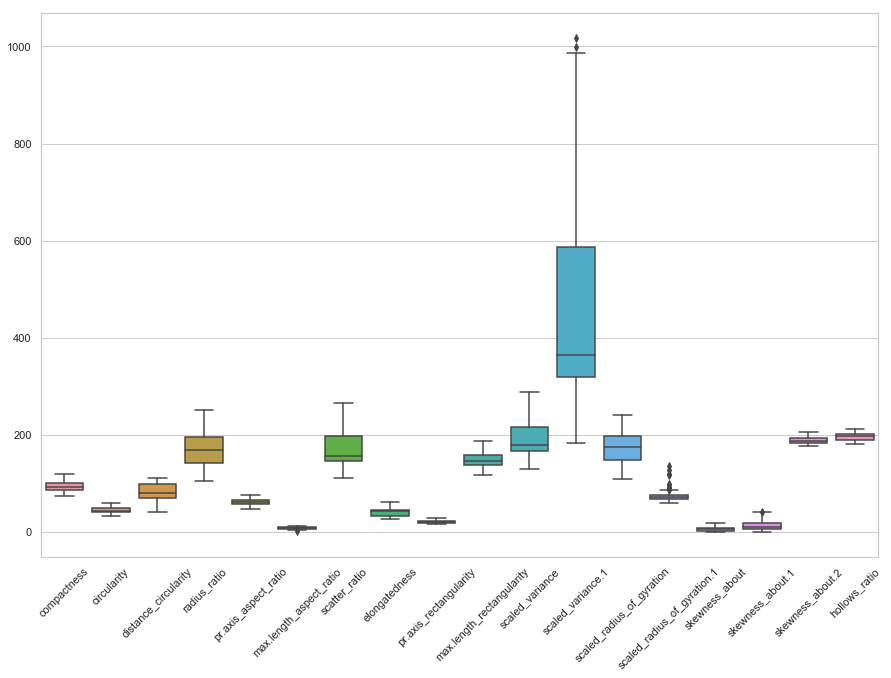

In [113]:
# After Treating the outliers
plt.figure(figsize=(15,10))
labels = sh_df.columns
sns.set(style='whitegrid')
sbplot = sns.boxplot(data=sh_df)
sbplot.set_xticklabels(labels=labels, rotation=45)

In [114]:
print('# Shape of dataset before removing outliers:{}'.format(sh_df.shape[0]))

## Treating ouliers. Action to take - drop the rows

# sh_df.drop(sh_df.index[outlier_rec], inplace=True)

print('# Shape of dataset before after outliers:{}'.format(sh_df.shape[0]))

# Shape of dataset before removing outliers:846
# Shape of dataset before after outliers:846


### 2. Understanding the attributes - Find relationship between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why (2.5 points)


####      Two appraoch to find relationship between different attributes (Independent variable)¶

1) Using correlation matrix and plot in heatmap to see visually

2) Using variance inflation factor (VIF)

In [42]:

# Create correlation matrix
corr_matrix = sh_df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
to_drop

['elongatedness',
 'pr.axis_rectangularity',
 'max.length_rectangularity',
 'scaled_variance',
 'scaled_variance.1']

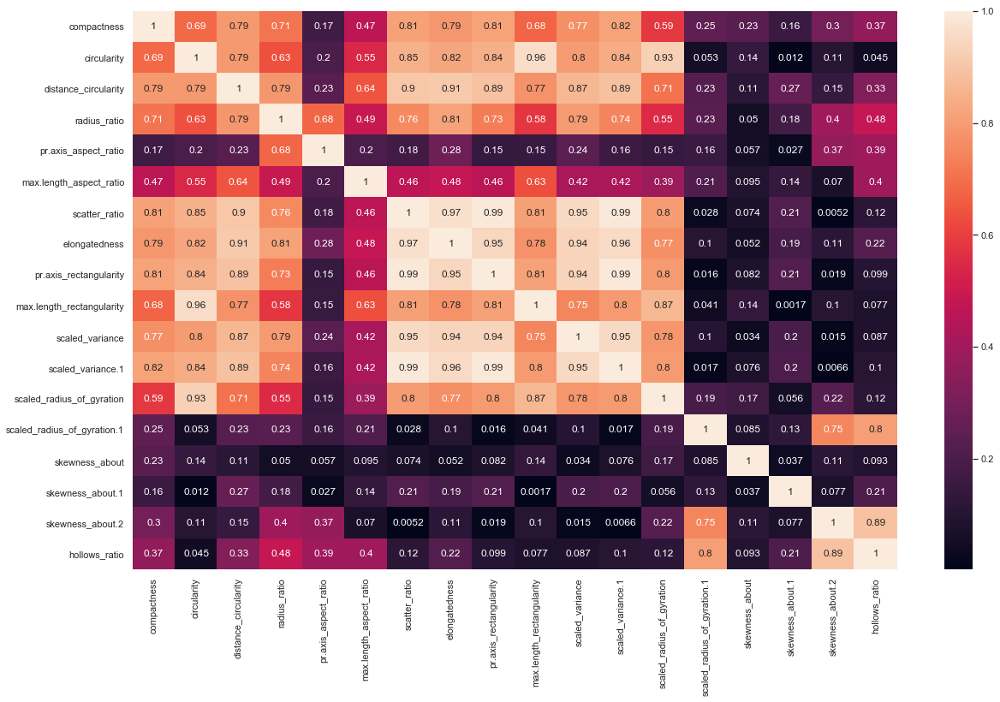

In [43]:
plt.figure(figsize=(20,12))
sns.heatmap(corr_matrix, annot=True)

In [44]:
# Standardize the dataset
from sklearn.preprocessing import StandardScaler

# Standardize the feature matrix
feature_space = pd.DataFrame(sh_df, columns=numeric_cols)
std_sh = StandardScaler().fit_transform(feature_space)

std_sh_df = pd.DataFrame(std_sh, columns=numeric_cols)

In [45]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

predictor_variables = numeric_cols

threshold = 10
for i in np.arange(0,len(predictor_variables)):
    vif = [variance_inflation_factor(std_sh_df[predictor_variables].values, j) for j in range(std_sh_df[predictor_variables].shape[1])]
    maxindex = vif.index(max(vif))
    if max(vif) > threshold:
        #print ("VIF :", vif)
        print('Eliminating \'' + std_sh_df[predictor_variables].columns[maxindex] + '\' at index: ' + str(maxindex))
        #del predictor_variables[maxindex]
    else:
        break

Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6
Eliminating 'scatter_ratio' at index: 6


### 3. Use PCA from scikit learn and elbow plot to find out reduced number of dimension (which covers more than 95% of the variance) - 10 points

In [46]:
C_df2 = sh_df.drop(columns=['class'])

In [47]:
from sklearn.decomposition import PCA

# Create a PCA that will retain 95% of the variance
pca_model = PCA()

X_test_reduced = pca_model.fit_transform(std_sh_df)
X_test_reduced.shape

(846, 18)

In [48]:
pca_model.components_

array([[ 2.72309648e-01,  2.88505662e-01,  3.02346567e-01,
         2.67766395e-01,  9.51653369e-02,  1.89858448e-01,
         3.10902027e-01, -3.09089186e-01,  3.07935629e-01,
         2.79231130e-01,  3.00591300e-01,  3.07653564e-01,
         2.64897583e-01, -3.42140296e-02,  4.11122110e-02,
         5.85970714e-02,  3.51986558e-02,  8.18318796e-02],
       [-1.00200443e-01,  1.31829895e-01, -5.49412498e-02,
        -1.91532122e-01, -2.39736179e-01, -1.01388477e-01,
         6.74283225e-02, -4.36581824e-03,  7.98800073e-02,
         1.20932751e-01,  8.10074663e-02,  7.40971656e-02,
         2.13766469e-01,  4.74200760e-01, -4.02670879e-02,
        -1.05917349e-01, -5.19178420e-01, -5.23977284e-01],
       [-1.73258843e-01, -6.82895527e-02, -5.26126409e-02,
         2.89902042e-01,  5.62581670e-01, -1.53720250e-01,
         1.53299645e-02, -7.53480500e-02, -8.97628273e-03,
        -1.20943347e-01,  1.27294401e-01,  1.21938927e-02,
        -4.55379105e-02,  2.22558876e-01, -6.67123300e

In [49]:
e_variance = pca_model.explained_variance_
e_variance

array([9.72092060e+00, 3.16106957e+00, 1.19653230e+00, 1.19311939e+00,
       8.66641182e-01, 7.64188080e-01, 3.54941462e-01, 2.50809515e-01,
       1.87485195e-01, 9.22605349e-02, 6.39918602e-02, 4.60864294e-02,
       4.37757512e-02, 2.96788700e-02, 1.96990431e-02, 1.78170651e-02,
       9.23611228e-03, 3.04880698e-03])

In [50]:
e_variance_ratio = pca_model.explained_variance_ratio_
e_variance_ratio

array([5.39412786e-01, 1.75407394e-01, 6.63954420e-02, 6.62060604e-02,
       4.80898213e-02, 4.24047103e-02, 1.96956616e-02, 1.39173917e-02,
       1.04035323e-02, 5.11952666e-03, 3.55090110e-03, 2.55733076e-03,
       2.42911149e-03, 1.64687715e-03, 1.09309768e-03, 9.88666928e-04,
       5.12510827e-04, 1.69177955e-04])

In [51]:
np.cumsum(e_variance_ratio)

array([0.53941279, 0.71482018, 0.78121562, 0.84742168, 0.8955115 ,
       0.93791621, 0.95761188, 0.97152927, 0.9819328 , 0.98705233,
       0.99060323, 0.99316056, 0.99558967, 0.99723655, 0.99832964,
       0.99931831, 0.99983082, 1.        ])

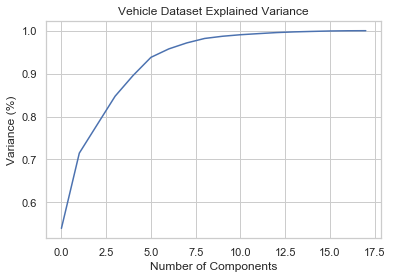

In [52]:
#Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca_model.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Vehicle Dataset Explained Variance')
plt.show()

Based on the above cummulative sum, the first 3 columns covers 95% variance

#### Correlation between componenets and features


In [53]:
pca_df = pd.DataFrame(data=pca_model.components_, columns=C_df2.columns)

In [54]:
pca_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.272310,0.288506,0.302347,0.267766,0.095165,0.189858,0.310902,-0.309089,0.307936,0.279231,0.300591,0.307654,0.264898,-0.034214,0.041112,0.058597,0.035199,0.081832
1,-0.100200,0.131830,-0.054941,-0.191532,-0.239736,-0.101388,0.067428,-0.004366,0.079880,0.120933,0.081007,0.074097,0.213766,0.474201,-0.040267,-0.105917,-0.519178,-0.523977
2,-0.173259,-0.068290,-0.052613,0.289902,0.562582,-0.153720,0.015330,-0.075348,-0.008976,-0.120943,0.127294,0.012194,-0.045538,0.222559,-0.667123,0.007440,-0.019291,-0.065716
3,0.039994,-0.190541,0.105523,-0.098049,-0.380557,-0.080020,0.117680,-0.066927,0.126861,-0.175051,0.093812,0.119830,-0.204891,-0.051031,-0.275315,0.759699,-0.064793,-0.013104
4,0.164652,-0.136001,-0.101717,0.122420,0.084826,-0.730299,0.102723,-0.095197,0.096603,-0.266897,0.168980,0.145457,0.006305,0.102787,0.407225,-0.020792,0.213770,-0.126761


In [55]:
pca_df.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.007843,0.000885,-0.008950,0.001978,0.000317,-0.007196,-0.004816,-0.001192,0.000342,-0.005161,-0.002923,-0.006440,-0.009993,0.000745,-0.004250,0.000194,0.000299
circularity,0.007843,1.000000,-0.019410,0.196308,-0.043385,-0.006960,0.157830,0.105622,0.026146,-0.007503,0.113201,0.064105,0.141262,0.219176,-0.016336,0.093222,-0.004266,-0.006548
distance_circularity,0.000885,-0.019410,1.000000,0.022150,-0.004895,-0.000785,0.017808,0.011918,0.002950,-0.000847,0.012773,0.007233,0.015939,0.024730,-0.001843,0.010519,-0.000481,-0.000739
radius_ratio,-0.008950,0.196308,0.022150,1.000000,0.049509,0.007942,-0.180108,-0.120530,-0.029837,0.008562,-0.129179,-0.073153,-0.161201,-0.250113,0.018641,-0.106380,0.004868,0.007473
pr.axis_aspect_ratio,0.001978,-0.043385,-0.004895,0.049509,1.000000,-0.001755,0.039805,0.026638,0.006594,-0.001892,0.028549,0.016167,0.035626,0.055276,-0.004120,0.023511,-0.001076,-0.001652
max.length_aspect_ratio,0.000317,-0.006960,-0.000785,0.007942,-0.001755,1.000000,0.006386,0.004273,0.001058,-0.000304,0.004580,0.002594,0.005715,0.008867,-0.000661,0.003772,-0.000173,-0.000265
scatter_ratio,-0.007196,0.157830,0.017808,-0.180108,0.039805,0.006386,1.000000,-0.096905,-0.023989,0.006884,-0.103859,-0.058815,-0.129604,-0.201089,0.014987,-0.085529,0.003914,0.006008
elongatedness,-0.004816,0.105622,0.011918,-0.120530,0.026638,0.004273,-0.096905,1.000000,-0.016053,0.004607,-0.069503,-0.039359,-0.086733,-0.134571,0.010030,-0.057237,0.002619,0.004021
pr.axis_rectangularity,-0.001192,0.026146,0.002950,-0.029837,0.006594,0.001058,-0.023989,-0.016053,1.000000,0.001140,-0.017205,-0.009743,-0.021470,-0.033312,0.002483,-0.014169,0.000648,0.000995
max.length_rectangularity,0.000342,-0.007503,-0.000847,0.008562,-0.001892,-0.000304,0.006884,0.004607,0.001140,1.000000,0.004937,0.002796,0.006161,0.009560,-0.000713,0.004066,-0.000186,-0.000286


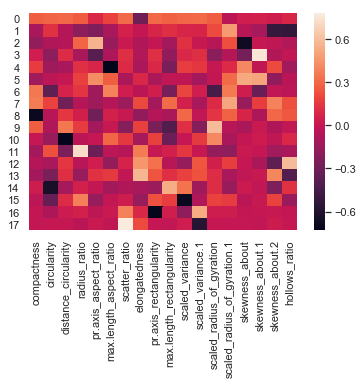

In [56]:
sns.heatmap(pca_df)

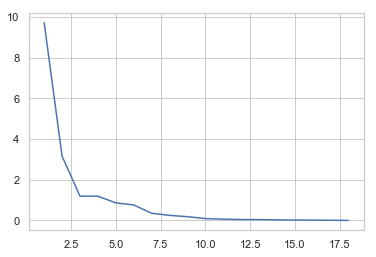

In [57]:
range_ = list(range(1,X_test_reduced.shape[1]+1))

plt.plot(range_, e_variance)

In [58]:
cum_var_exp = np.cumsum(e_variance_ratio)

e_variance_ratio, cum_var_exp

(array([5.39412786e-01, 1.75407394e-01, 6.63954420e-02, 6.62060604e-02,
        4.80898213e-02, 4.24047103e-02, 1.96956616e-02, 1.39173917e-02,
        1.04035323e-02, 5.11952666e-03, 3.55090110e-03, 2.55733076e-03,
        2.42911149e-03, 1.64687715e-03, 1.09309768e-03, 9.88666928e-04,
        5.12510827e-04, 1.69177955e-04]),
 array([0.53941279, 0.71482018, 0.78121562, 0.84742168, 0.8955115 ,
        0.93791621, 0.95761188, 0.97152927, 0.9819328 , 0.98705233,
        0.99060323, 0.99316056, 0.99558967, 0.99723655, 0.99832964,
        0.99931831, 0.99983082, 1.        ]))

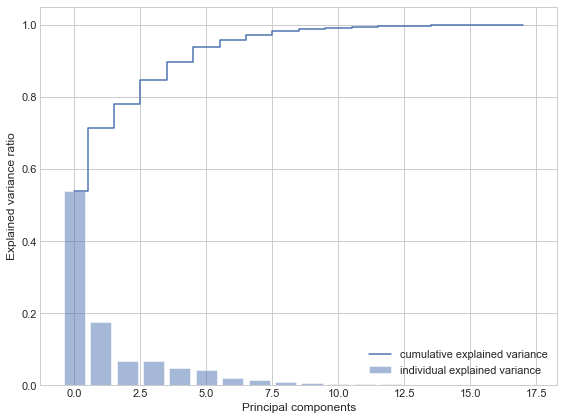

In [59]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(8, 6))

    plt.bar(range(len(e_variance_ratio)), e_variance_ratio, alpha=0.5, align='center',
            label='individual explained variance')
    plt.step(range(len(e_variance_ratio)), cum_var_exp, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

In [60]:
# Repeating the above steps by removing the collinear columns
std_sh_drop_df = std_sh_df.drop(to_drop, axis=1)

print(std_sh_drop_df.shape)
std_sh_drop_df.head()

(846, 13)


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.517302,0.056545,0.287723,1.858171,0.867276,-0.208038,0.285618,-0.327938,-0.069503,0.380665,-0.312193,0.183957
1,-0.325470,-0.624564,0.120112,-0.850348,-0.743740,0.394826,-0.599893,-0.513719,-0.059987,0.553405,0.156589,0.013088,0.452977
2,1.254193,0.843549,1.518571,1.241242,0.817407,0.867276,1.148382,1.392391,0.073989,1.591584,-0.403603,-0.149552,0.049447
3,-0.082445,-0.624564,-0.007021,-0.296691,0.297024,0.394826,-0.750606,-1.466773,-1.265769,-0.069503,-0.291565,1.639494,1.529056
4,-1.054545,-0.135193,-0.769817,1.118208,2.378554,1.812177,-0.599893,0.408593,7.308682,0.553405,-0.179527,-1.450677,-1.699181


In [68]:
pca_model = PCA(n_components=7)

X_test_reduced = pca_model.fit_transform(std_sh_drop_df)

In [69]:
pca_model.components_

array([[-0.36670069, -0.35601942, -0.3988937 , -0.37919939, -0.1756613 ,
        -0.2822505 , -0.37914701, -0.31135534,  0.12445068, -0.0749812 ,
        -0.08621168, -0.12925528, -0.19850955],
       [ 0.0089776 ,  0.25702313,  0.06979747, -0.07938911, -0.18880243,
        -0.00755828,  0.1886819 ,  0.33174512,  0.46906324, -0.00932412,
        -0.08971561, -0.51703103, -0.4958304 ],
       [-0.17665163,  0.02617315, -0.10632542,  0.29248202,  0.6750045 ,
        -0.10187854, -0.05120462,  0.04936921,  0.20475261, -0.46709319,
        -0.37094997,  0.0207073 , -0.04534806],
       [-0.06661136, -0.11019921,  0.1217731 ,  0.0544463 , -0.04543913,
         0.07819306,  0.10811583, -0.15180351,  0.05787619, -0.62893087,
         0.71032007, -0.13824315, -0.01201274],
       [ 0.00664759, -0.12530335, -0.07555822,  0.22140082,  0.38827546,
        -0.38250739,  0.01776722, -0.02069846,  0.2955731 ,  0.53721443,
         0.4925126 ,  0.02993799, -0.11084193],
       [-0.29478944, -0.014684

In [70]:
pca_model.explained_variance_

array([5.51728612, 2.92357046, 1.18074492, 1.11301483, 0.76837701,
       0.67710708, 0.31577685, 0.20308193, 0.14402132, 0.0535837 ,
       0.04802619, 0.03565988, 0.03513434])

In [71]:
pca_model.explained_variance_ratio_

array([0.42390496, 0.22462421, 0.09071917, 0.08551532, 0.05903606,
       0.05202359, 0.02426181, 0.01560322, 0.01106547, 0.00411695,
       0.00368996, 0.00273983, 0.00269945])

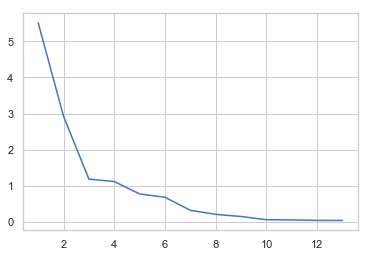

In [72]:
e_variance = pca_model.explained_variance_
range_ = list(range(1,std_sh_drop_df.shape[1]+1))

plt.plot(range_, e_variance)

In [73]:
e_variance_ratio = pca_model.explained_variance_ratio_
cum_var_exp = np.cumsum(e_variance_ratio)

e_variance_ratio, cum_var_exp

(array([0.42390496, 0.22462421, 0.09071917, 0.08551532, 0.05903606,
        0.05202359, 0.02426181, 0.01560322, 0.01106547, 0.00411695,
        0.00368996, 0.00273983, 0.00269945]),
 array([0.42390496, 0.64852917, 0.73924834, 0.82476367, 0.88379972,
        0.93582332, 0.96008513, 0.97568835, 0.98675382, 0.99087077,
        0.99456073, 0.99730055, 1.        ]))

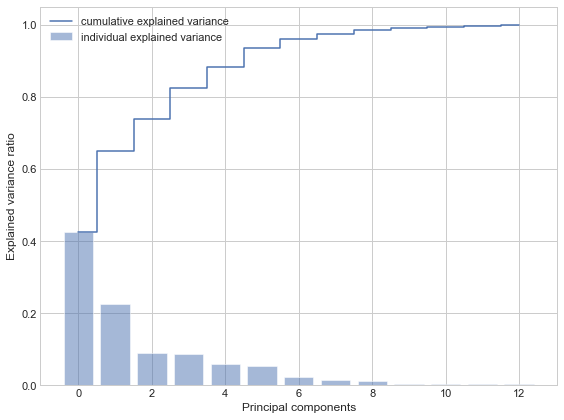

In [74]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(8, 6))

    plt.bar(range(len(e_variance_ratio)), e_variance_ratio, alpha=0.5, align='center',
            label='individual explained variance')
    plt.step(range(len(e_variance_ratio)), cum_var_exp, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

In [75]:
corr_df = pd.DataFrame(pca_model.components_)

corr_df

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.366701,-0.356019,-0.398894,-0.379199,-0.175661,-0.282251,-0.379147,-0.311355,0.124451,-0.074981,-0.086212,-0.129255,-0.198510
1,0.008978,0.257023,0.069797,-0.079389,-0.188802,-0.007558,0.188682,0.331745,0.469063,-0.009324,-0.089716,-0.517031,-0.495830
2,-0.176652,0.026173,-0.106325,0.292482,0.675005,-0.101879,-0.051205,0.049369,0.204753,-0.467093,-0.370950,0.020707,-0.045348
3,-0.066611,-0.110199,0.121773,0.054446,-0.045439,0.078193,0.108116,-0.151804,0.057876,-0.628931,0.710320,-0.138243,-0.012013
4,0.006648,-0.125303,-0.075558,0.221401,0.388275,-0.382507,0.017767,-0.020698,0.295573,0.537214,0.492513,0.029938,-0.110842
5,-0.294789,-0.014684,-0.015572,-0.028228,0.247007,0.779765,-0.257325,-0.100441,0.130501,0.262351,0.096291,-0.253628,0.083885
6,0.569459,-0.320899,-0.011913,0.162793,-0.122421,0.204640,0.065525,-0.452189,0.481847,-0.033063,-0.194478,0.093780,-0.024036
7,-0.053140,0.287137,-0.295600,-0.117458,-0.192895,0.050412,-0.183736,0.325671,0.528073,-0.100005,0.139415,0.441665,0.361407
8,-0.605872,-0.221183,0.470265,0.277873,-0.283081,-0.057219,0.236847,-0.076274,0.244827,0.086849,-0.162234,0.185885,0.109342
9,0.211791,-0.437193,0.522579,-0.237678,0.116459,-0.078835,-0.450575,0.431909,0.089112,-0.057914,-0.009260,-0.052260,0.104758


### 4. Use Support vector machines and use grid search (try C values - 0.01, 0.05, 0.5, 1 and kernel = linear, rbf) and find out the best hyper parameters and do cross validation to find the accuracy. (7.5 points)

### SVM Approach - 1

In [76]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

In [77]:
parameter_candidates = [
  {'C':[0.01, 0.05, 0.5, 1], 'kernel': ['linear']},
  {'C':[0.01, 0.05, 0.5, 1], 'kernel': ['rbf']}
]

In [78]:
X = std_sh_df
y = sh_df['class']
# Create a classifier object with the classifier and parameter candidates
clf = GridSearchCV(estimator=SVC(), param_grid=parameter_candidates, cv = 5)

# Train the classifier on data1's feature and target data
clf.fit(X, y)

C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193:

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid=[{'C': [0.01, 0.05, 0.5, 1], 'kernel': ['linear']},
                         {'C': [0.01, 0.05, 0.5, 1], 'kernel': ['rbf']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [79]:
# Let’s look at the accuracy score when we apply the model to the data1’s test data.

# View the accuracy score
print('Best score for data1:', clf.best_score_)

Best score for data1: 0.966903073286052


In [80]:
# Which parameters are the best? We can tell scikit-learn to display them:
# View the best parameters for the model found using grid search
print('Best C:',clf.best_estimator_.C) 
print('Best Kernel:',clf.best_estimator_.kernel)

Best C: 1
Best Kernel: rbf


In [81]:
# Repeating the above steps dropping columns with coorelation > .95
X = std_sh_drop_df
y = sh_df['class']
# Create a classifier object with the classifier and parameter candidates
clf = GridSearchCV(estimator=SVC(), param_grid=parameter_candidates, cv = 5)

# Train the classifier on data1's feature and target data
clf.fit(X, y)

C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193:

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid=[{'C': [0.01, 0.05, 0.5, 1], 'kernel': ['linear']},
                         {'C': [0.01, 0.05, 0.5, 1], 'kernel': ['rbf']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [82]:
# Let’s look at the accuracy score when we apply the model to the data1’s test data.

# View the accuracy score
print('Best score for data1:', clf.best_score_)

Best score for data1: 0.9491725768321513


In [83]:
# Which parameters are the best? We can tell scikit-learn to display them:
# View the best parameters for the model found using grid search
print('Best C:',clf.best_estimator_.C) 
print('Best Kernel:',clf.best_estimator_.kernel)

Best C: 1
Best Kernel: rbf


In [84]:
# Use SVC with redcued feature set fro PCA
X = X_test_reduced
y = sh_df['class']
# Create a classifier object with the classifier and parameter candidates
clf = GridSearchCV(estimator=SVC(), param_grid=parameter_candidates, cv = 5)

# Train the classifier on data1's feature and target data
clf.fit(X, y) 

# View the accuracy score
print('Best score for data1:', clf.best_score_)

# Which parameters are the best? We can tell scikit-learn to display them:
# View the best parameters for the model found using grid search
print('Best C:',clf.best_estimator_.C) 
print('Best Kernel:',clf.best_estimator_.kernel)

C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193:

Best score for data1: 0.9491725768321513
Best C: 1
Best Kernel: rbf


C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\svm\base.py:193:

### SVM Approach - 2

In [85]:
from sklearn.model_selection import train_test_split

# To calculate the accuracy score of the model
from sklearn.metrics import accuracy_score, confusion_matrix

target = sh_df["class"]
features = sh_df.drop(["class"], axis=1)
X_train, X_test, y_train, y_test = train_test_split(features, target, stratify=target, test_size = 0.2, random_state = 10)

In [118]:
print(X_train.shape)
print(X_test.shape)

(676, 18)
(170, 18)


In [119]:
print(y_train.shape)
print(y_test.shape)

(676,)
(170,)


In [120]:
# use from sklearn.svm import SVC
from sklearn.svm import SVC

# Building a Support Vector Machine on train data
svc_model = SVC(C= .1, kernel='linear', gamma= 1)
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

In [121]:
# check the accuracy on the training set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.9763313609467456
0.9411764705882353


In [122]:
print("Confusion Matrix:\n",confusion_matrix(prediction,y_test))

Confusion Matrix:
 [[38  3  0]
 [ 3 82  0]
 [ 3  1 40]]


In [123]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled = scaler.fit(features)

In [124]:
data_scaled= scaler.transform(features)

In [125]:
data_scaled

array([[0.47826087, 0.57692308, 0.59722222, ..., 0.3902439 , 0.36666667,
        0.53333333],
       [0.39130435, 0.30769231, 0.61111111, ..., 0.34146341, 0.43333333,
        0.6       ],
       [0.67391304, 0.65384615, 0.91666667, ..., 0.2195122 , 0.4       ,
        0.5       ],
       ...,
       [0.7173913 , 0.80769231, 0.84722222, ..., 0.09756098, 0.36666667,
        0.66666667],
       [0.2826087 , 0.11538462, 0.52777778, ..., 0.6097561 , 0.46666667,
        0.46666667],
       [0.26086957, 0.11538462, 0.36111111, ..., 0.43902439, 0.33333333,
        0.3       ]])

In [126]:
X_train, X_test, y_train, y_test = train_test_split(data_scaled, target, stratify=target, test_size = 0.2, random_state = 10)

In [127]:
# Building a Support Vector Machine on train data
svc_model = SVC(C= .1, kernel='linear', gamma= 1)
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

In [128]:
# check the accuracy on the training set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.8505917159763313
0.8


In [129]:
print("Confusion Matrix:\n",confusion_matrix(prediction,y_test))

Confusion Matrix:
 [[28  3  5]
 [12 73  0]
 [ 4 10 35]]


In [130]:
# Building a Support Vector Machine on train data
svc_model = SVC(C= 1000, kernel='linear', gamma= 1)
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

In [131]:
# check the accuracy on the training set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.9792899408284024
0.9411764705882353


In [132]:
print("Confusion Matrix:\n",confusion_matrix(prediction,y_test))

Confusion Matrix:
 [[39  3  0]
 [ 3 82  1]
 [ 2  1 39]]


Inreasing C allowed us to improve the model

In [133]:
import multiprocessing 
from sklearn.model_selection import GridSearchCV

In [134]:
param_grid = [    {        
     'kernel': ['linear', 'rbf'],        
     'C': [ 0.01, 0.05, 0.5, 1 ]    } ]

In [135]:
gs = GridSearchCV(estimator=SVC(), param_grid=param_grid,scoring='accuracy', cv=10, n_jobs=multiprocessing.cpu_count())

In [136]:
gs.fit(X_train, y_train) # (This X_train is X_train_scaled;  y_train 

C:\Users\ABHIJEET\Anaconda4\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=4,
             param_grid=[{'C': [0.01, 0.05, 0.5, 1],
                          'kernel': ['linear', 'rbf']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [137]:
# hyper parameters
gs.best_estimator_

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [138]:
gs.best_score_ 

0.908284023668639

### Cross Validation

In [139]:
# Building a Support Vector Machine with best hyper parameters
svc_model = SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)
    
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

In [140]:
# check the accuracy on the training set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.9215976331360947
0.8764705882352941


In [141]:
print("Confusion Matrix:\n",confusion_matrix(prediction,y_test))

Confusion Matrix:
 [[36  6  3]
 [ 5 76  0]
 [ 3  4 37]]


The SVM Model was applied using two approaches. It has been determined by Approach-1, programmatically, that out of two kernels (Linear / RBF), the best one would be RBF and the best score was close to 96%. 

With the Approach-2, both the Linear and RBF were applied separately by splitting the data in 80/20 ration. In this approach, even the cross validation was implemented.
